<h1><span style='font-family: "Trebuchet MS", Helvetica, sans-serif;'>CV - Module Project Part-2 Face Recognition</span></h1>

<h4><ul>
    <li>
        <span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;"><strong>DOMAIN: </strong>Face recognition</span>
    </li>
</ul></h4>

<h4><ul>
    <li>
        <article><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">CONTEXT:</span></strong></article>
    </li>
</ul>
<article>
    <font face="Trebuchet MS, Helvetica, sans-serif">Company X intends to build a face identification model to recognise human faces.</font>
</article> </h4>

<h4><ul>
    <li>
        <article><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;"><strong>DATA DESCRIPTION:</strong></span></article>
    </li>
</ul>
<article><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">DATA DESCRIPTION: Face Aligned Face Dataset from Pinterest. This dataset contains 10,770 images for 100 people. All images are taken
from 'Pinterest' and aligned using dlib library. </span></article>
    </h4>

<h4>
<ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">PROJECT OBJECTIVE:</span></strong></li>
</ul>
<p><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Face Recognition - In this project, we use a pre-trained model trained on Face recognition to recognise similar faces. Here, we are particularly interested in recognising whether two given faces are of the same person or not.</span></p>
    </h4>

In [1]:
# imports

# !pip install opencv-python
# !pip install scikit-image

import os
import re
import random
import warnings
from time import time
from math import floor
from pathlib import Path
import pandas as pd, numpy as np
from pprint import pprint
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import trange, tqdm
from collections import defaultdict
import tensorflow as tf
import cv2
import skimage
from plantcv import plantcv as pcv
from skimage.io import imread, imshow
from skimage.color import rgb2gray, rgb2hsv, gray2rgb
from skimage.filters import sobel, threshold_otsu, gaussian, unsharp_mask
from skimage.feature import canny
from skimage.measure import find_contours
from skimage.morphology import binary_dilation, dilation


warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
# reproducibility
seed = 1996
random.seed(seed)

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Load the dataset and create metadata</span></strong></li>
</ul></h3>

In [3]:
data_dir = Path('./data/Part 3 - Aligned Face Dataset from Pinterest/PINS/')
PEOPLE = os.listdir(data_dir)
NUM_PEOPLE = len(PEOPLE)

def clean_name(text):
    text = re.sub('pins_', '', text)
    text = re.sub('face', '', text)
    text = re.sub('_', '', text)
    text = text.title()
    return str(text)

# some degree of class imbalance but not too much
for p in PEOPLE:
    print(clean_name(p),
          f"{' '*(25 - len(clean_name(p)))}: {len(os.listdir(data_dir / p))}")

print(f'\nTotal: {NUM_PEOPLE}')  # Face Aligned Images from 100 people gathered from Pinterest

Aaron Paul                : 86
Alexandra Daddario        : 165
Alvaro Morte              : 91
Alycia Debnam Carey       : 144
Amanda Crew               : 118
Amaury Nolasco            : 113
Amber Heard               : 151
Anna Gunn                 : 66
Anne Hathaway             : 151
Barbara Palvin            : 142
Bellamy Blake             : 89
Benedict Cumberbatch      : 81
Betsy Brandt              : 68
Bill Gates                : 86
Brenton Thwaites          : 130
Brie Larson               : 128
Brit Marling              : 122
Bryan Cranston            : 80
Caity Lotz                : 123
Cameron Monaghan          : 112
Chadwick Boseman          : 119
Chance Perdomo            : 86
Chris Evans               : 88
Chris Pratt               : 141
Cobie Smulders            : 130
Danielle Panabaker        : 115
Dave Franco               : 126
David Mazouz              : 104
Dominic Purcell           : 107
Drake                     : 38
Dua Lipa                  : 137
Dwayne Johnson     

In [4]:
def load_dataset(data_dir=data_dir):
    '''loads the images and returns the dictionary of arrays'''
    data = defaultdict(list)
    dataset = defaultdict(list)
    for p in PEOPLE:
        images = os.listdir(data_dir / p)
        for image_name in tqdm(images,
                               desc=f"{clean_name(p)}{' '*(25 - len(clean_name(p)))}",
                               ncols=100):
            img_path =  data_dir / p / image_name
            img = imread(img_path)
            data['labels'].append(clean_name(p)) # METADATA: Name (Cleaned)
            data['images'].append(img)  # Associated Image
            dataset[clean_name(p)].append(img)
    return dict(data), dict(dataset)

data, images = load_dataset()

Zendaya                  : 100%|█████████████████████████████████| 109/109 [00:00<00:00, 736.48it/s]


In [5]:
# total dataset of 10770 images
len(data['images'])

10770

In [6]:
data.keys()  # all images in two arrays with associated labels (names)

dict_keys(['labels', 'images'])

In [7]:
images.keys()  # to acess images of people using Name directly

dict_keys(['Aaron Paul', 'Alexandra Daddario', 'Alvaro Morte', 'Alycia Debnam Carey ', 'Amanda Crew', 'Amaury Nolasco', 'Amber Heard ', 'Anna Gunn', 'Anne Hathaway', 'Barbara Palvin ', 'Bellamy Blake ', 'Benedict Cumberbatch', 'Betsy Brandt', 'Bill Gates', 'Brenton Thwaites', 'Brie Larson', 'Brit Marling', 'Bryan Cranston', 'Caity Lotz', 'Cameron Monaghan', 'Chadwick Boseman ', 'Chance Perdomo', 'Chris Evans', 'Chris Pratt', 'Cobie Smulders', 'Danielle Panabaker', 'Dave Franco', 'David Mazouz', 'Dominic Purcell', 'Drake', 'Dua Lipa ', 'Dwayne Johnson', 'Eliza Taylor', 'Elizabeth Olsen ', 'Elon Musk', 'Emilia Clarke', 'Emily Bett Rickards', 'Emma Stone', 'Emma Watson ', 'Gal Gadot ', 'Grant Gustin ', 'Gwyneth Paltrow', 'Henry Cavil', 'Jason Isaacs', 'Jason Momoa', 'Jeff Bezos', 'Jeremy Renner', 'Jesse Eisenberg', 'Jim Parsons', 'Jon Bernthal', 'Josh Radnor', 'Kiernan Shipka', 'Kit Harington', 'Kristen Stewart ', 'Krysten Ritter', 'Kumail Nanjiani', 'Lindsey Morgan ', 'Maisie Williams', 

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Check some samples</span></strong></li>
</ul></h3>

In [8]:
def display(img, label, fontsize=18, cmap=None, shape=True):
    '''helper to show images'''
    if cmap is None:
        plt.imshow(img)
    else:
        plt.imshow(img, cmap=cmap)
    plt.axis('off')
    plt.title(f'{label}', fontsize=18)
    plt.axis('off')
    plt.show()
    if shape:
        print(f'Shape: {img.shape}')

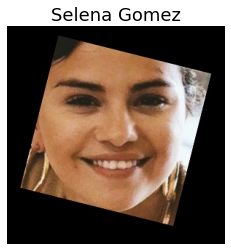

Shape: (299, 299, 3)


In [9]:
ind = random.choice(range(len(data['images'])))
# display random image from our dataset
display(img=data['images'][ind], label=data['labels'][ind])

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Load the pre-trained model and weights</span></strong></li>
</ul></h3>

In [10]:
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import (Dropout,
                                     Flatten,
                                     Activation,
                                     ZeroPadding2D,
                                     Convolution2D,
                                     MaxPooling2D)

In [11]:
def vgg():	
    model = Sequential()
    model.add(ZeroPadding2D((1,1),input_shape=(224,224, 3)))
    model.add(Convolution2D(64, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))
    
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(128, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(128, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))
    
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(256, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(256, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(256, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))
    
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))
    
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))
    
    model.add(Convolution2D(4096, (7, 7), activation='relu'))
    model.add(Dropout(0.5))
    model.add(Convolution2D(4096, (1, 1), activation='relu'))
    model.add(Dropout(0.5))
    model.add(Convolution2D(2622, (1, 1)))
    model.add(Flatten())
    model.add(Activation('softmax'))
    return model

In [12]:
# load the pretrained weights
vgg_model = vgg()
vgg_model.load_weights('./data/Part 3 - vgg_face_weights.h5')

In [13]:
from keras.utils.layer_utils import count_params
def get_params(model):
    trainable_count = count_params(model.trainable_weights)
    non_trainable_count = count_params(model.non_trainable_weights)
    print('Total params: {:,}'.format(trainable_count + non_trainable_count))
    print('Trainable params: {:,}'.format(trainable_count))
    print('Non-trainable params: {:,}'.format(non_trainable_count))

get_params(vgg_model)

Total params: 145,002,878
Trainable params: 145,002,878
Non-trainable params: 0


Using TensorFlow backend.


In [14]:
vgg_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
zero_padding2d (ZeroPadding2 (None, 226, 226, 3)       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 224, 224, 64)      1792      
_________________________________________________________________
zero_padding2d_1 (ZeroPaddin (None, 226, 226, 64)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 224, 224, 64)      36928     
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 112, 112, 64)      0         
_________________________________________________________________
zero_padding2d_2 (ZeroPaddin (None, 114, 114, 64)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 112, 112, 128)     7

In [15]:
vgg_face = Model(inputs=vgg_model.layers[0].input, outputs=vgg_model.layers[-2].output)

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Generate Embedding vectors for each face in the dataset</span></strong></li>
</ul></h3>

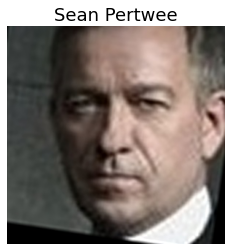

Shape: (299, 299, 3)


In [16]:
ind = random.choice(range(len(data['images'])))
# display random image from our dataset
display(img=data['images'][ind], label=data['labels'][ind])

img=data['images'][ind]

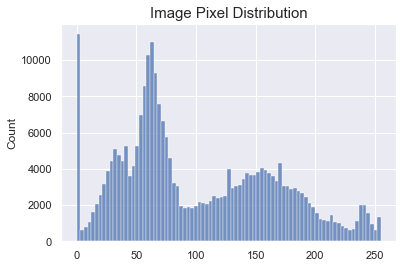

In [17]:
# Image pixles range between 0 - 255 -> Scale to 0 - 1 to use with the vgg model
sns.set()
sns.histplot(img.flatten())
plt.title('Image Pixel Distribution', fontsize=15)
plt.show()

In [18]:
# get embedding vector for the random image in the data using our pre-trained VGG Face model
HEIGHT = 224
WIDTH = 224

# scaling pixel values from orignal scale: [0-255] to range: [0-1]
print('Original Shape: ', img.shape)
img = (img / 255.).astype(np.float32)

img = cv2.resize(img, dsize=(HEIGHT, WIDTH))
print('Scaled Shape:   ', img.shape)

# get the embedding vector for the above image using vgg_face_descriptor model and print the shape
img_emb = vgg_face.predict(np.expand_dims(img, axis=0))[0]
print('Image Embedding Shape: ', img_emb.shape)

Original Shape:  (299, 299, 3)
Scaled Shape:    (224, 224, 3)
Image Embedding Shape:  (2622,)


In [19]:
pprint(img_emb, compact=True)

array([ 0.01217856, -0.02279992, -0.00221974, ..., -0.02014877,
       -0.01565544, -0.01233729], dtype=float32)


In [20]:
# generate embeddings for all images in the dataset
embeddings = []
embeddings = np.zeros((len(data['images']), img_emb.shape[0]))
for idx in trange(len(data['images']), ncols=100):
    try:
        image = data['images'][idx]
        image = (image/255.).astype(np.float32)
        image = cv2.resize(image, dsize=(HEIGHT, WIDTH))
        embeddings[idx] = vgg_face.predict(np.expand_dims(image, axis=0))[0]
    except Exception as e:
        print(e)
        embeddings[idx] = np.zeros(2622)
embeddings = np.array(embeddings)

100%|█████████████████████████████████████████████████████████| 10770/10770 [15:03<00:00, 11.92it/s]


In [21]:
embeddings[1].shape

(2622,)

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Build distance metrics for identifying the distance between two given images</span></strong></li>
</ul></h3>

In [22]:
from numpy.linalg import norm

def l2_distance(x, y):
    '''Squared L2 Distance'''
    return np.sum(np.square(x - y))

def cosine_similarity(x,y):
    '''Cosine Similarity between vectors'''
    return 1 - np.dot(x, y)/(norm(x)*norm(y))

distances = {str(distance.__name__): distance for distance in (l2_distance, cosine_similarity)}
distances

{'l2_distance': <function __main__.l2_distance(x, y)>,
 'cosine_similarity': <function __main__.cosine_similarity(x, y)>}

In [23]:
def distance_pair(idx1, idx2, metric='l2_distance',
              embeddings=embeddings):
    plt.figure(figsize=(8,3))
    distance = distances.get(metric, None)
    plt.suptitle(f'Distance = {distance(embeddings[idx1], embeddings[idx2]):.3f}')
    plt.subplot(121)
    img=data['images'][idx1]
    label=data['labels'][idx1]
    plt.axis('off')
    plt.imshow(img)
    plt.title(label)
    plt.subplot(122)
    img=data['images'][idx2]
    label=data['labels'][idx2]
    plt.axis('off')
    plt.imshow(img)
    plt.title(label)

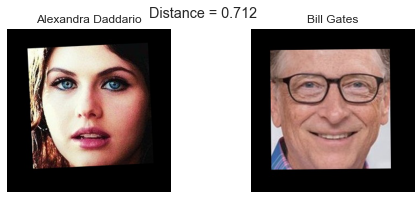

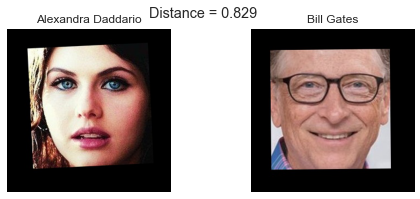

In [24]:
distance_pair(100, 1500)
distance_pair(100, 1500, metric='cosine_similarity')

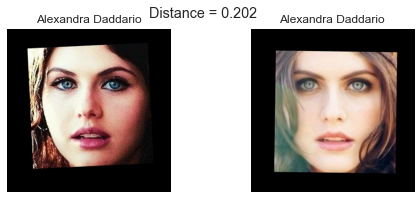

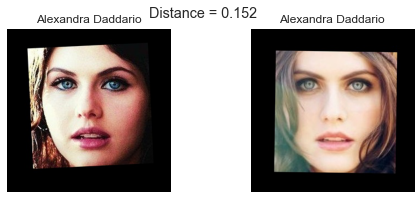

In [25]:
distance_pair(100, 102)
distance_pair(100, 102, metric='cosine_similarity')

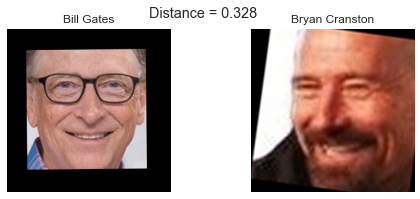

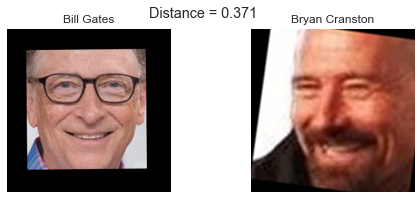

In [26]:
distance_pair(1500, 2000)
distance_pair(1500, 2000, metric='cosine_similarity')

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Use PCA for dimensionality reduction</span></strong></li>
</ul></h3>

In [27]:
# Label Encoding for the names (categorical var)
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
Y = le.fit_transform(data['labels'])
Y.shape

(10770,)

In [28]:
le.classes_

array(['Aaron Paul', 'Alexandra Daddario', 'Alvaro Morte',
       'Alycia Debnam Carey ', 'Amanda Crew', 'Amaury Nolasco',
       'Amber Heard ', 'Anna Gunn', 'Anne Hathaway', 'Barbara Palvin ',
       'Bellamy Blake ', 'Benedict Cumberbatch', 'Betsy Brandt',
       'Bill Gates', 'Brenton Thwaites', 'Brie Larson', 'Brit Marling',
       'Bryan Cranston', 'Caity Lotz', 'Cameron Monaghan',
       'Chadwick Boseman ', 'Chance Perdomo', 'Chris Evans',
       'Chris Pratt', 'Cobie Smulders', 'Danielle Panabaker',
       'Dave Franco', 'David Mazouz', 'Dominic Purcell', 'Drake',
       'Dua Lipa ', 'Dwayne Johnson', 'Eliza Taylor', 'Elizabeth Olsen ',
       'Elon Musk', 'Emilia Clarke', 'Emily Bett Rickards', 'Emma Stone',
       'Emma Watson ', 'Gal Gadot ', 'Grant Gustin ', 'Gwyneth Paltrow',
       'Henry Cavil', 'Jason Isaacs', 'Jason Momoa', 'Jeff Bezos',
       'Jeremy Renner', 'Jesse Eisenberg', 'Jim Parsons', 'Jon Bernthal',
       'Josh Radnor', 'Kiernan Shipka', 'Kit Harington',
 

In [29]:
np.unique(Y)  # 100 names converted to encodings

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=int64)

In [75]:
# split into train and test to before applying PCA to prevent data leakage and inflated results
SPLIT = 0.1  # 10% of images go into test set
# take a sample of indices from the whole set to use in test set
test_indices = np.array(random.sample(range(len(data['images'])), int(len(data['images']) * SPLIT)))
# diff (all - test_indices => train_indices)
train_indices = np.array(list(set(list(range(len(data['images'])))).difference(set(test_indices))))
# Split using the indices
X_train = embeddings[train_indices]
X_test = embeddings[test_indices]
X_train.shape, X_test.shape

((9693, 2622), (1077, 2622))

In [76]:
y_train = Y[train_indices]
y_test = Y[test_indices]
y_train.shape, y_test.shape

((9693,), (1077,))

In [77]:
# scale the values in embeddings to use PCA
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
X_train_scaled = sc.fit_transform(X_train)
X_test_scaled = sc.transform(X_test)  # do not fit on testing data to prevent data leakage

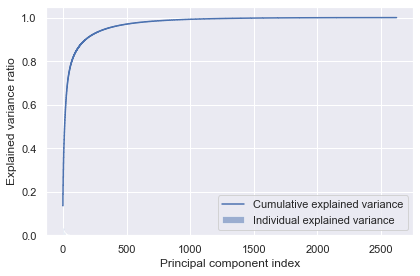

In [78]:
# Principal Components Decomposition
from sklearn.decomposition import PCA

pca = PCA()
X_train_pca = pca.fit_transform(X_train_scaled)
exp_var_pca = pca.explained_variance_ratio_


# Cumulative sum of eigenvalues to create step plot for visualizing
# the variance explained by each principal component+-
cum_sum_eigenvalues = np.cumsum(exp_var_pca)

plt.bar(range(0,len(exp_var_pca)), exp_var_pca, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(0,len(cum_sum_eigenvalues)), cum_sum_eigenvalues, where='mid', label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

In [79]:
EXPLAINED_THRESH = 0.99
# solve and find number of components for 97% explained
pca = PCA(n_components=EXPLAINED_THRESH, svd_solver='full')
X_train_pc = pca.fit_transform(X_train_scaled)

#pca.explained_variance_ratio_
print(f"Principal Components: {pca.n_components_}"
      f"\nTotal explained variance = {pca.explained_variance_ratio_.sum():.6f}")

Principal Components: 901
Total explained variance = 0.990003


In [80]:
X_test_pc = pca.transform(X_test_scaled)  # transform test data

In [81]:
X_train_pc.shape, X_test_pc.shape

((9693, 901), (1077, 901))

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Build an SVM classifier in order to map images</span></strong></li>
</ul></h3>

In [82]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# hyper paramter tuning
parameters = {'C':[1, 10, 100],'gamma':[1, 0.1, 0.01], 'kernel':['linear','rbf']}
clf = GridSearchCV(SVC(), parameters, cv=6, verbose=10, n_jobs=-1)

In [83]:
clf.fit(X_train_pc, y_train)

Fitting 6 folds for each of 18 candidates, totalling 108 fits


GridSearchCV(cv=6, estimator=SVC(), n_jobs=-1,
             param_grid={'C': [1, 10, 100], 'gamma': [1, 0.1, 0.01],
                         'kernel': ['linear', 'rbf']},
             verbose=10)

In [84]:
clf.best_params_

{'C': 1, 'gamma': 1, 'kernel': 'linear'}

In [85]:
svc = SVC(C=1, gamma=1, kernel='linear', probability=False, random_state=seed)
svc.fit(X_train_pc, y_train)

SVC(C=1, gamma=1, kernel='linear', random_state=1996)

In [86]:
def scores(model):
    '''accuracies helper'''
    train_acc = model.score(X_train_pc, y_train)
    test_acc = model.score(X_test_pc, y_test)
    print(f'Train: {train_acc*100:.2f}%')
    print(f'Test:  {test_acc*100:.2f}%')

def plot_confusion(y_true, y_pred, title=''):
    sns.set()
    plt.figure(figsize=(35, 35))
    conf = confusion_matrix(y_true, y_pred)
    ax = sns.heatmap(conf.T, annot=True, fmt='.0f', cmap=sns.color_palette("rocket", as_cmap=True))
    ax.set_title(title, y=1.20, fontsize=40)
    plt.xlabel('Predicted Values')
    plt.ylabel('True Values')
    plt.show()

In [87]:
scores(svc)

Train: 99.98%
Test:  96.47%


In [88]:
y_pred = svc.predict(X_test_pc)

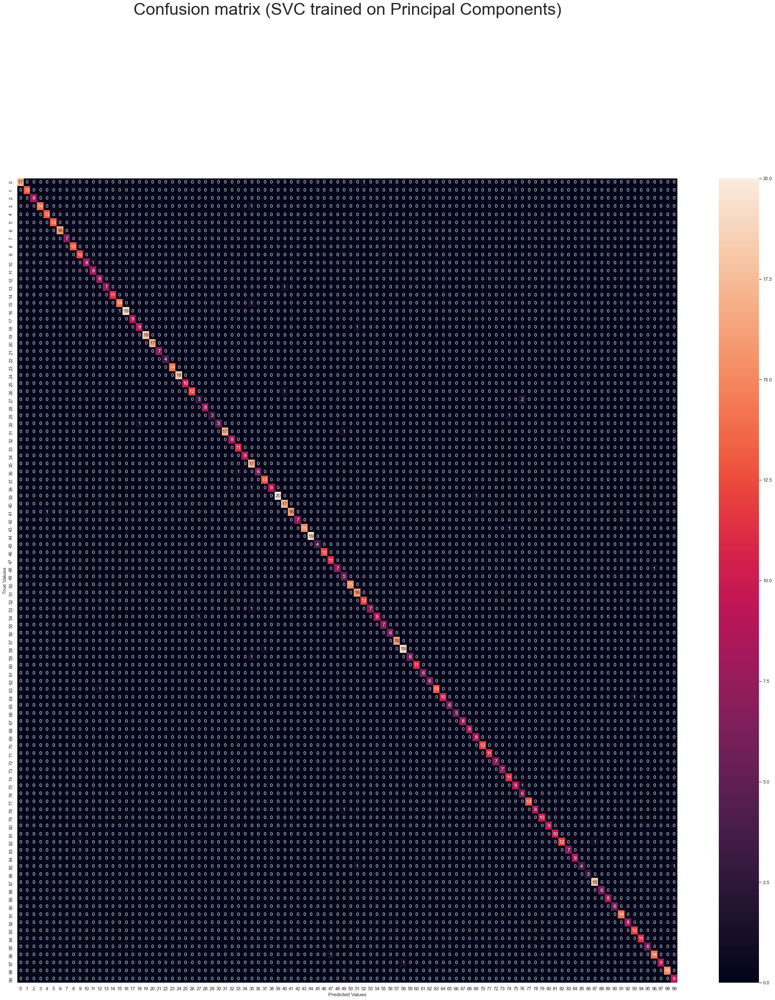

In [89]:
plot_confusion(y_test, y_pred, title='Confusion matrix (SVC trained on Principal Components)')

In [90]:
print(f'Classification Report: \n{classification_report(y_test, y_pred, target_names=le.classes_)}')

Classification Report: 
                      precision    recall  f1-score   support

          Aaron Paul       0.94      1.00      0.97        17
  Alexandra Daddario       0.93      1.00      0.96        13
        Alvaro Morte       1.00      1.00      1.00         8
Alycia Debnam Carey        0.93      1.00      0.97        14
         Amanda Crew       1.00      0.93      0.96        14
      Amaury Nolasco       1.00      1.00      1.00        13
        Amber Heard        1.00      1.00      1.00        16
           Anna Gunn       1.00      1.00      1.00         7
       Anne Hathaway       1.00      1.00      1.00        13
     Barbara Palvin        1.00      0.92      0.96        13
      Bellamy Blake        0.89      1.00      0.94         8
Benedict Cumberbatch       1.00      0.89      0.94         9
        Betsy Brandt       1.00      0.89      0.94         9
          Bill Gates       0.88      1.00      0.93         7
    Brenton Thwaites       1.00      1.00    

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Import the the test image. Display the image. Use the SVM trained model to predict the face.</span></strong></li>
</ul></h3>

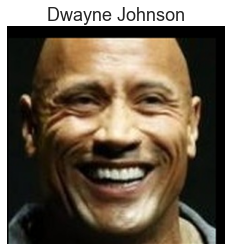

Shape: (299, 299, 3)


In [91]:
img_path = Path('./data/Part 2 Test Images/Part_2_-_Test_Image_-_Dwayne_Johnson4.jpg')
test_img_dwayne = imread(img_path)
display(test_img_dwayne, label='Dwayne Johnson')

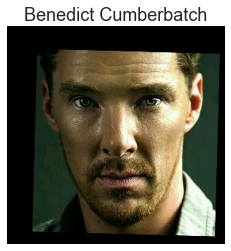

Shape: (299, 299, 3)


In [92]:
img_path = Path('./data/Part 2 Test Images/Part_2-_Test_Image_-_Benedict_Cumberbatch9.jpg')
test_img_cumberbatch = imread(img_path)
display(test_img_cumberbatch, label='Benedict Cumberbatch')

In [98]:
# predict
def recognize_face(img, actual=None):
    # scale the image
    image = (img/255.).astype(np.float32)
    # resize to 224 x 224
    image = cv2.resize(image, dsize=(HEIGHT, WIDTH))
    # get embedding
    embedding = vgg_face.predict(np.expand_dims(image, axis=0))[0]
    
    # scale using StandardScaler
    scaled = sc.transform(embedding.reshape(1, -1))
    
    # get the principal components
    pc = pca.transform(scaled)

    # predict using trained SVC model
    pred = svc.predict(pc)
    # inverse tranform encoding to the corresponding name
    pred = le.inverse_transform(pred)[0]
    pred = f'Prediction: {pred}'
    if actual is not None:
        pred = f'Actual: {actual}\n' + pred
    display(img, label=pred, shape=False)

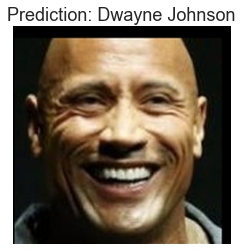

In [99]:
# detect faces in the prediction image
recognize_face(test_img_dwayne)

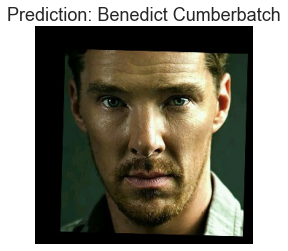

In [100]:
# detect faces in the prediction image
recognize_face(test_img_cumberbatch)

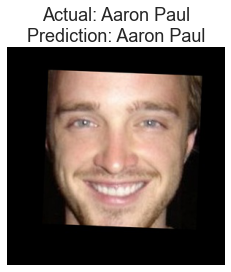

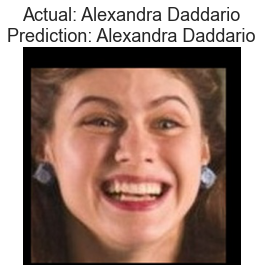

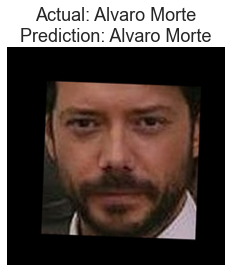

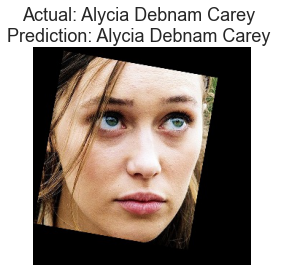

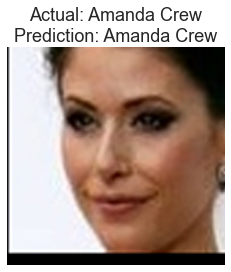

...

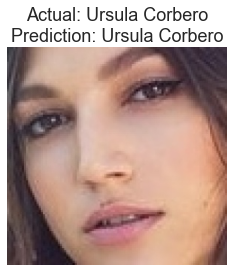

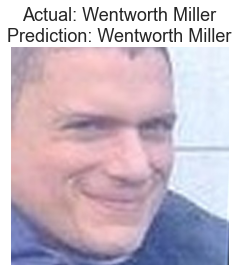

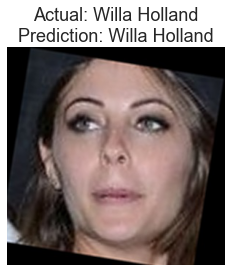

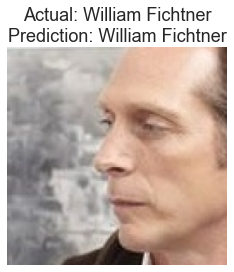

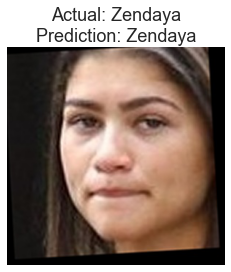

In [101]:
# test on a random imaage of all people
imgs = list()
labels = list()
for p in images:
    # get random images for each species
    for i in range(1):
        imgs.append(random.choice(images[p]))
        labels.append(p)

for test_img, label in zip(imgs, labels):
    recognize_face(test_img, actual=label)

<h4><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>Our Objective was to train a face recognition model using pretrained weights from the VGG Face architecture to generate image embeddings which are scaled and principal components are calculated to reduce dimensions and an SVC Classifier model is trained.
</span></ul></h4>

<h4><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>Also, from the training accuracy of 99.98% and testing accuracy of 96.47% and the model seems to be overfitting somewhat. We can use other better models or add some regularization.
</span></ul></h4>

<h4><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>As seen from the final test Images, the model does a pretty good job of recognizing faces. But, could be even better with more training data.
</span></ul></h4>